## Overview of simulated and real data

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

from sklearn.neighbors import KNeighborsRegressor

import gpytorch
import torch

from scipy.stats import norm

# ignore warnings
import warnings
warnings.filterwarnings("ignore")

np.random.seed(123)
torch.manual_seed(123)

In [4]:
# Get the data directory located one level up from the current working directory
data_dir = os.path.join(os.path.dirname(os.getcwd()), 'data')

# Load the real issa spectra data from CSV files
issa_data = pd.read_excel(os.path.join(data_dir, 'ISSA_17_Jan_2025_Yan_Lu.xlsx'), sheet_name='ISSA')
issa_wavelengths = issa_data.iloc[10, 17:48].values.astype(float)
issa_sites = issa_data.iloc[11:, 6].values.astype(int)
issa_spectra = issa_data.iloc[11:, 17:48].to_numpy()

# Load the meta spectra and params data from pt files
train_dir = os.path.join(data_dir, 'train')
meta_spectra_file = 'dataset_wide_thickness_wide_spectrum_380_1000nm_2nm_1M_photons_spec_test_me[0.001-0.430]_bl[0.000-0.200]_th[0.000-1.000]_eu[0.650-0.800]_ox[0.900-1.000].pt'
meta_params_file = 'dataset_wide_thickness_wide_spectrum_380_1000nm_2nm_1M_photons_params_test_me[0.001-0.430]_bl[0.000-0.200]_th[0.000-1.000]_eu[0.650-0.800]_ox[0.900-1.000].pt'

meta_full_spectra = 100 * torch.load(os.path.join(train_dir, meta_spectra_file)).numpy()
meta_params = torch.load(os.path.join(train_dir, meta_params_file))
meta_wavelengths = 380.0 + np.arange(meta_full_spectra.shape[1]) * 2

# Filter the meta spectra to include only wavelengths present in the issa spectra
meta_spectra = meta_full_spectra[:, np.isin(meta_wavelengths, issa_wavelengths)]
# Filter the issa spectra to include only face sites
face_spectra = issa_spectra[np.isin(issa_sites, [2, 3, 4, 5, 6, 9]), :]

# Display shape of spectra data in a table
shape_data = {
    'Dataset': ['Meta Spectra (Full wavelength)', 'Meta Spectra (Used wavelength)', 'ISSA Spectra (All sites)', 'ISSA Spectra (Face)'],
    'Sample Size': [meta_full_spectra.shape[0], meta_spectra.shape[0], issa_spectra.shape[0], face_spectra.shape[0]],
    'Wavelength Count': [meta_full_spectra.shape[1], meta_spectra.shape[1], issa_spectra.shape[1], face_spectra.shape[1]],
    'Wavelength Range': [
        f"{meta_wavelengths[0]}-{meta_wavelengths[-1]} nm",
        f"{issa_wavelengths[0]}-{issa_wavelengths[-1]} nm",
        f"{issa_wavelengths[0]}-{issa_wavelengths[-1]} nm",
        f"{issa_wavelengths[0]}-{issa_wavelengths[-1]} nm"
    ]
}

shape_df = pd.DataFrame(shape_data)
shape_df

,Dataset,Sample Size,Wavelength Count,Wavelength Range
0,Meta Spectra (Full wavelength),3624,310,380.0-998.0 nm
1,Meta Spectra (Used wavelength),3624,31,400.0-700.0 nm
2,ISSA Spectra (All sites),15256,31,400.0-700.0 nm
3,ISSA Spectra (Face),8033,31,400.0-700.0 nm


The face sites in the ISSA dataset include site IDs 2, 3, 4, 5, 6, and 9, which correspond to cheek, cheek bone, chin, ear bone, forehead, and nose tip.

Summary Statistics for Simulated Meta Parameters:

In [ ]:
# Calculate summary statistics for each parameter in meta_params
param_names = [
    'Melanin Volume Fraction',
    'Blood Volume Fraction',
    'Thickness',
    'Eumelanin Ratio',
    'Oxygenated Hemoglobin Ratio',
]

param_df = pd.DataFrame(meta_params.cpu().numpy(), columns=param_names)
param_summary = param_df.describe().T
param_summary

,Parameter,Min,Max,Mean,Std
0,Melanin Volume Fraction,0.001,0.429,0.108,0.122
1,Blood Volume Fraction,0.001,0.200,0.041,0.053
2,Thickness,0.001,0.035,0.018,0.010
3,Eumelanin Ratio,0.650,0.800,0.725,0.043
4,Oxygenated Hemoglobin Ratio,0.900,1.000,0.950,0.029


Let us examine the ISSA face skin reflectance spectra, and the Meta simulated skin reflectance spectra.

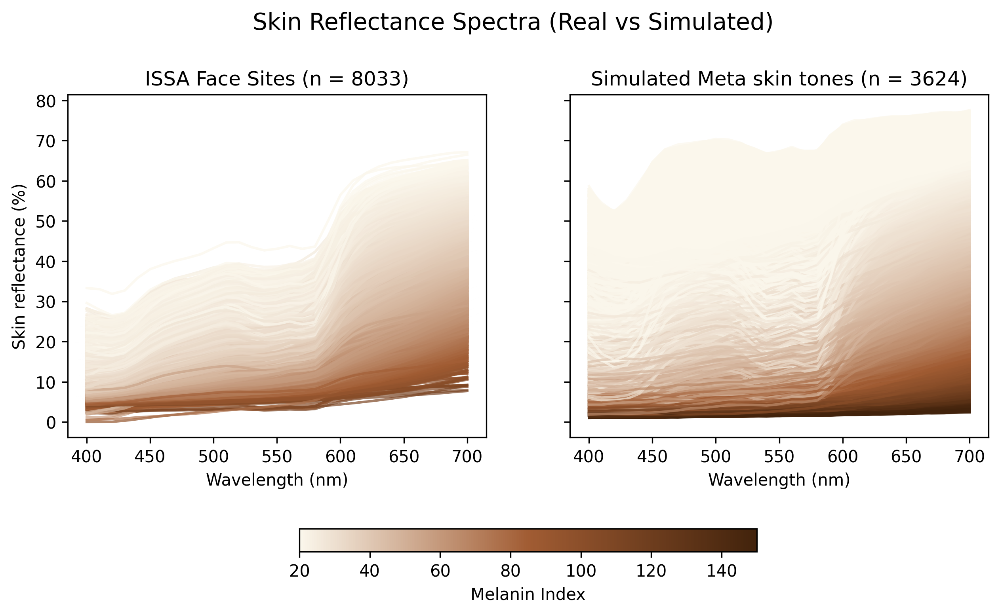

In [7]:
# Calculate the melanin index
meta_mi = 100 * np.log10(100 / meta_spectra[:, 28]) # 680 nm
issa_mi = 100 * np.log10(100 / face_spectra[:, 28]) # 680 nm

def plot_spectra(meta_spectra, meta_mi, issa_spectra_face, issa_mi, wavelengths):
    fitzpatrick = ["#fbf7ec", "#a15c33", "#42230c"]
    cmap = LinearSegmentedColormap.from_list("fitzpatrick", fitzpatrick)
    norm = plt.Normalize(vmin=20, vmax=150)
    meta_mi_clipped = np.clip(meta_mi, 20, 150)
    issa_mi_clipped = np.clip(issa_mi, 20, 150)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5), sharey=True, dpi=300)

    # Plot ISSA spectra
    ax = axes[0]
    for i in range(issa_spectra_face.shape[0]):
        color = cmap(norm(issa_mi_clipped[i]))
        ax.plot(wavelengths, issa_spectra_face[i, :], color=color, alpha=0.7)
    ax.set_title(f'ISSA Face Sites (n = {issa_spectra_face.shape[0]})')
    ax.set_xlabel('Wavelength (nm)')
    ax.set_ylabel('Skin reflectance (%)')
    # Plot Meta spectra
    ax = axes[1]
    for i in range(meta_spectra.shape[0]):
        color = cmap(norm(meta_mi_clipped[i]))
        ax.plot(wavelengths, meta_spectra[i, :], color=color, alpha=0.7)
    ax.set_title(f'Simulated Meta skin tones (n = {meta_spectra.shape[0]})')
    ax.set_xlabel('Wavelength (nm)')
    # -------- Colorbar --------
    sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])

    cbar = fig.colorbar(
        sm,
        ax=axes.ravel().tolist(),
        orientation="horizontal",
        fraction=0.05,     # thickness
        pad=0.2            # distance from plots
    )
    cbar.set_label("Melanin Index")

    # ---- Common title ----
    fig.suptitle("Skin Reflectance Spectra (Real vs Simulated)", fontsize=14, y=1.02)
    plt.show()

plot_spectra(meta_spectra, meta_mi, face_spectra, issa_mi, issa_wavelengths)

## Filter the simulated skin reflectance spectra based on the ISSA dataset

We establish two interpretable rules to determine whether a simulated skin reflectance curve is realistic. They are based on the skin reflectance spectra from the ISSA dataset. The two rules are:

1. Pointwise reflectance values should lie within the $0.9\min$ and $1.1\max$ values observed in the ISSA dataset at each wavelength. We relax the bounds by 10% to account for some variability.
2. Conditional dependence between wavelengths should be the same pattern as that observed in the ISSA dataset. 

### Pointwise criteria

In [10]:
# Calculate the min and maxs of ISSA face spectra
face_min = np.min(face_spectra, axis=0)
face_max = np.max(face_spectra, axis=0)

# Filter the simulated skin reflectance spectra based on the pointwise quantiles
def filter_spectra_pointwise(spectra, min, max):
    return np.logical_and(spectra >= min, spectra <= max)

valid_pointwise = filter_spectra_pointwise(meta_spectra, 0.9*face_min, 1.1*face_max)
valid_pointwise_indices = np.all(valid_pointwise, axis=1)

# print(f"Number of valid simulated spectra after pointwise filtering: {np.sum(valid_pointwise_indices)} out of {meta_spectra.shape[0]}")

# Split the meta spectra and melanin index into valid and invalid sets
meta_spectra_pointwise_valid = meta_spectra[valid_pointwise_indices, :]
meta_mi_pointwise_valid = meta_mi[valid_pointwise_indices]
meta_spectra_pointwise_invalid = meta_spectra[~valid_pointwise_indices, :]
meta_mi_pointwise_invalid = meta_mi[~valid_pointwise_indices]

In [9]:
# Save the pointwise validity results to CSV
output_dir = os.path.join(os.path.dirname(os.getcwd()), 'output')
os.makedirs(output_dir, exist_ok=True)

# Create DataFrame with proper row and column names
valid_pointwise_df = pd.DataFrame(
    valid_pointwise,
    columns=[f'{int(wl)}nm' for wl in issa_wavelengths],
    index=[f'Sample_{i}' for i in range(meta_spectra.shape[0])]
)

# Save to CSV
output_file = os.path.join(output_dir, 'pointwise_validity.csv')
valid_pointwise_df.to_csv(output_file)
# print(f"Saved pointwise validity results to {output_file}")

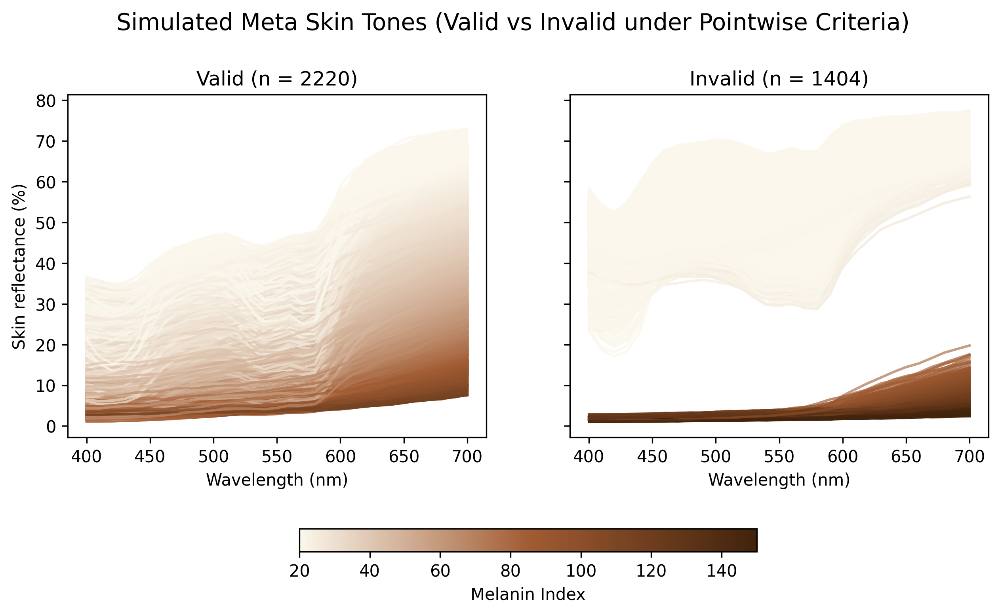

In [11]:
def plot_spectra_filtered(spectra_valid, mi_valid, spectra_invalid, mi_invalid, wavelengths, title):
    fitzpatrick = ["#fbf7ec", "#a15c33", "#42230c"]
    cmap = LinearSegmentedColormap.from_list("fitzpatrick", fitzpatrick)
    norm = plt.Normalize(vmin=20, vmax=150)
    valid_mi_clipped = np.clip(mi_valid, 20, 150)
    invalid_mi_clipped = np.clip(mi_invalid, 20, 150)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5), sharey=True, dpi=300)

    # Plot valid spectra
    ax = axes[0]
    for i in range(spectra_valid.shape[0]):
        color = cmap(norm(valid_mi_clipped[i]))
        ax.plot(wavelengths, spectra_valid[i, :], color=color, alpha=0.7)
    ax.set_title(f'Valid (n = {spectra_valid.shape[0]})')
    ax.set_xlabel('Wavelength (nm)')
    ax.set_ylabel('Skin reflectance (%)')
    # Plot invalid spectra
    ax = axes[1]
    for i in range(spectra_invalid.shape[0]):
        color = cmap(norm(invalid_mi_clipped[i]))
        ax.plot(wavelengths, spectra_invalid[i, :], color=color, alpha=0.7)
    ax.set_title(f'Invalid (n = {spectra_invalid.shape[0]})')
    ax.set_xlabel('Wavelength (nm)')
    
    # -------- Colorbar --------
    sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])

    cbar = fig.colorbar(
        sm,
        ax=axes.ravel().tolist(),
        orientation="horizontal",
        fraction=0.05,     # thickness
        pad=0.2            # distance from plots
    )
    cbar.set_label("Melanin Index")

    # ---- Common title ----
    fig.suptitle(title, fontsize=14, y=1.02)
    plt.show()

plot_spectra_filtered(meta_spectra_pointwise_valid, meta_mi_pointwise_valid, meta_spectra_pointwise_invalid, meta_mi_pointwise_invalid, issa_wavelengths, title="Simulated Meta Skin Tones (Valid vs Invalid under Pointwise Criteria)")

### Conditional dependencies

+ Pick several anchor wavelengths. Here the anchor wavelengths are $[400, 500, 550, 600, 700]$ (nm).

+ For any pair of anchor wavelengths $w_1<w_2$, run Gaussian process regression between skin reflectance at $w_1$ and $w_2$ of ISSA face sites.

+ Given a simulated skin spectra and a pair of anchor wavelengths $w_1<w_2$, predict the $99.5\%$ credible interval of skin reflectance at $w_2$ conditional on the simulated skin reflectance at $w_1$. Check whether the simulated skin reflectance at $w_2$ lies inside the $99.5\%$ credible interval.

+ Filter out the simulated skin spectra if its reflectance at some $w_2$ lies outside the corresponding $99.5\%$ credible interval. According to Bonferroni inequality, the false positive rate is under $5\%$.

In [12]:
# Sparse GP regression with GPyTorch
class SparseGPModel(gpytorch.models.ApproximateGP):
    def __init__(self, inducing_points):
        # Variational distribution over inducing variables
        variational_distribution = gpytorch.variational.CholeskyVariationalDistribution(
            inducing_points.size(0)
        )

        # Variational strategy: decide how f(x) depends on inducing points
        variational_strategy = gpytorch.variational.VariationalStrategy(
            self,
            inducing_points,
            variational_distribution,
            learn_inducing_locations=True,
        )

        super(SparseGPModel, self).__init__(variational_strategy)

        self.mean_module = gpytorch.means.ConstantMean()
        self.covar_module = gpytorch.kernels.ScaleKernel(
            gpytorch.kernels.SpectralMixtureKernel(num_mixtures=4)
        )

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)
    
def train_GP_model(X_train, y_train, inducing_points, num_epochs=100):
    model = SparseGPModel(inducing_points)
    likelihood = gpytorch.likelihoods.GaussianLikelihood()

    model.train()
    likelihood.train()

    optimizer = torch.optim.Adam(
        [{"params": model.parameters()}, {"params": likelihood.parameters()}], lr=0.1
    )

    mll = gpytorch.mlls.VariationalELBO(likelihood, model, num_data=y_train.size(0))

    for epoch in range(num_epochs):
        optimizer.zero_grad()
        output = model(X_train)
        loss = -mll(output, y_train)
        loss.backward()
        optimizer.step()

    return model, likelihood

def train_hetero_GP_model(X_train, y_train, noise_train, inducing_points, num_epochs=100):
    model = SparseGPModel(inducing_points)
    likelihood = gpytorch.likelihoods.FixedNoiseGaussianLikelihood(
        noise=noise_train,
        learn_additional_noise=False
    )

    model.train()
    likelihood.train()

    optimizer = torch.optim.Adam(
        [{"params": model.parameters()}, {"params": likelihood.parameters()}], lr=0.1
    )

    mll = gpytorch.mlls.VariationalELBO(likelihood, model, num_data=y_train.size(0))

    for epoch in range(num_epochs):
        optimizer.zero_grad()
        output = model(X_train)
        loss = -mll(output, y_train)
        loss.backward()
        optimizer.step()

    return model, likelihood

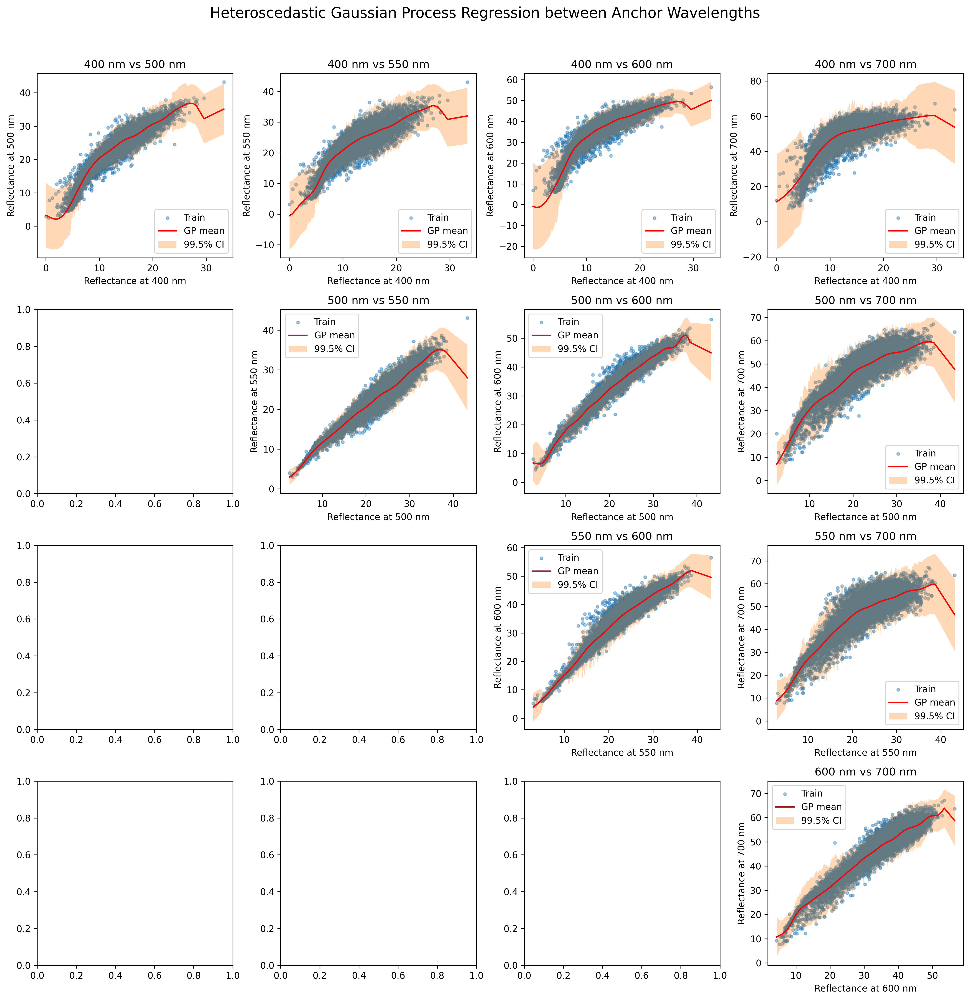

In [13]:
conf = 0.995
z = norm.ppf(0.5 + conf / 2) # z-score for the desired confidence level

models, likelihoods = [], []
noise_estimators = []
anchor_wavelengths = [400, 500, 550, 600, 700]
fig, axes = plt.subplots(4, 4, figsize=(15, 15), dpi=300)
for i in range(len(anchor_wavelengths)):
    for j in range(i + 1, len(anchor_wavelengths)):
        w1 = anchor_wavelengths[i]
        w2 = anchor_wavelengths[j]
        idx1 = np.where(issa_wavelengths == w1)[0][0]
        idx2 = np.where(issa_wavelengths == w2)[0][0]
        
        X_train = torch.from_numpy(face_spectra[:, idx1].reshape(-1, 1).astype(np.float32))
        y_train = torch.from_numpy(face_spectra[:, idx2].astype(np.float32))
        sorted_indices = torch.argsort(X_train.squeeze())
        X_train = X_train[sorted_indices]
        y_train = y_train[sorted_indices]
        inducing_points = np.linspace(X_train.min().item(), X_train.max().item(), 30).reshape(-1, 1)
        inducing_points = torch.from_numpy(inducing_points.astype(np.float32))
        
        model, likelihood = train_GP_model(X_train, y_train, inducing_points, num_epochs=100)

        # k-NN regression to estimate E[r^2 | x]
        model.eval()
        likelihood.eval()
        with torch.no_grad():
            post = model(X_train)
            mean_train = post.mean
        r2 = (y_train.numpy() - mean_train.numpy())**2
        k = 50 # number of neighbors
        knn = KNeighborsRegressor(
            n_neighbors=k,
            weights="uniform"
        )
        knn.fit(X_train.numpy(), r2)

        noise_estimators.append(knn)

        # Estimated noise variance at each training x
        sigma2_hat = knn.predict(X_train.numpy())
        sigma2_hat = np.clip(sigma2_hat, a_min=1e-6, a_max=np.percentile(sigma2_hat, 99.5))
        noise_train = torch.from_numpy(sigma2_hat).float()

        # Refit heteroscedastic GP model
        model, likelihood = train_hetero_GP_model(X_train, y_train, noise_train, inducing_points, num_epochs=100)

        models.append((w1, w2, model))
        likelihoods.append(likelihood)

        # Plot
        model.eval()
        likelihood.eval()
        with torch.no_grad():
            observed_pred = likelihood(model(X_train), noise=noise_train)
            mean = observed_pred.mean
            lower = mean - z * observed_pred.stddev
            upper = mean + z * observed_pred.stddev
        ax = axes[i, j - 1]
        ax.scatter(X_train.numpy(), y_train.numpy(), s=10, alpha=0.4, label="Train")
        ax.plot(X_train.numpy(), mean.numpy(), c="red", label="GP mean")
        ax.fill_between(
            X_train.squeeze().numpy(),
            lower.numpy(),
            upper.numpy(),
            alpha=0.3,
            label="99.5% CI",
        )
        ax.set_title(f"{w1} nm vs {w2} nm")
        
        ax.set_xlabel(f"Reflectance at {w1} nm")
        ax.set_ylabel(f"Reflectance at {w2} nm")
        ax.legend()

fig.suptitle("Heteroscedastic Gaussian Process Regression between Anchor Wavelengths", fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

In [14]:
# Filter the simulated spectra based on the conditional dependencies
def filter_spectra_conditional(spectra, models, likelihoods, noise_estimators, conf=0.995):
    z = norm.ppf(0.5 + conf / 2) # z-score for the desired confidence level
    valid_indices = []

    for (w1, w2, model), likelihood, knn in zip(models, likelihoods, noise_estimators):
        idx1 = np.where(issa_wavelengths == w1)[0][0]
        idx2 = np.where(issa_wavelengths == w2)[0][0]

        X_test = torch.from_numpy(spectra[:, idx1].reshape(-1, 1).astype(np.float32))
        y_test = torch.from_numpy(spectra[:, idx2].astype(np.float32))

        # Estimated noise variance at each test x
        sigma2_hat = knn.predict(X_test.numpy())
        sigma2_hat = np.clip(sigma2_hat, a_min=1e-6, a_max=np.percentile(sigma2_hat, 99.5))
        noise_test = torch.from_numpy(sigma2_hat).float()

        model.eval()
        likelihood.eval()
        with torch.no_grad():
            observed_pred = likelihood(model(X_test), noise=noise_test)
            mean = observed_pred.mean
            lower = mean - z * observed_pred.stddev
            upper = mean + z * observed_pred.stddev

        valid_indices.append((y_test.numpy() >= lower.numpy()) & (y_test.numpy() <= upper.numpy()))

    return valid_indices

valid_conditional = filter_spectra_conditional(meta_spectra, models, likelihoods, noise_estimators, conf=0.995)
valid_conditional = np.array(valid_conditional).transpose()
valid_conditional_indices = np.all(valid_conditional, axis=1)

# print(f"Number of valid simulated spectra after conditional filtering: {np.sum(valid_conditional_indices)} out of {meta_spectra.shape[0]}")

In [15]:
# Save the conditional-dependence validity results to CSV
output_dir = os.path.join(os.path.dirname(os.getcwd()), 'output')
os.makedirs(output_dir, exist_ok=True)

# Create proper column names for wavelength pairs
anchor_wavelengths = [400, 500, 550, 600, 700]
pair_names = []
for i in range(len(anchor_wavelengths)):
    for j in range(i + 1, len(anchor_wavelengths)):
        pair_names.append(f'{anchor_wavelengths[i]}nm_vs_{anchor_wavelengths[j]}nm')

# Create DataFrame with proper row and column names
valid_conditional_df = pd.DataFrame(
    valid_conditional,
    columns=pair_names,
    index=[f'Sample_{i}' for i in range(meta_spectra.shape[0])]
)

# Save to CSV
output_file = os.path.join(output_dir, 'conditional_validity.csv')
valid_conditional_df.to_csv(output_file)
# print(f"Saved conditional-dependence validity results to {output_file}")

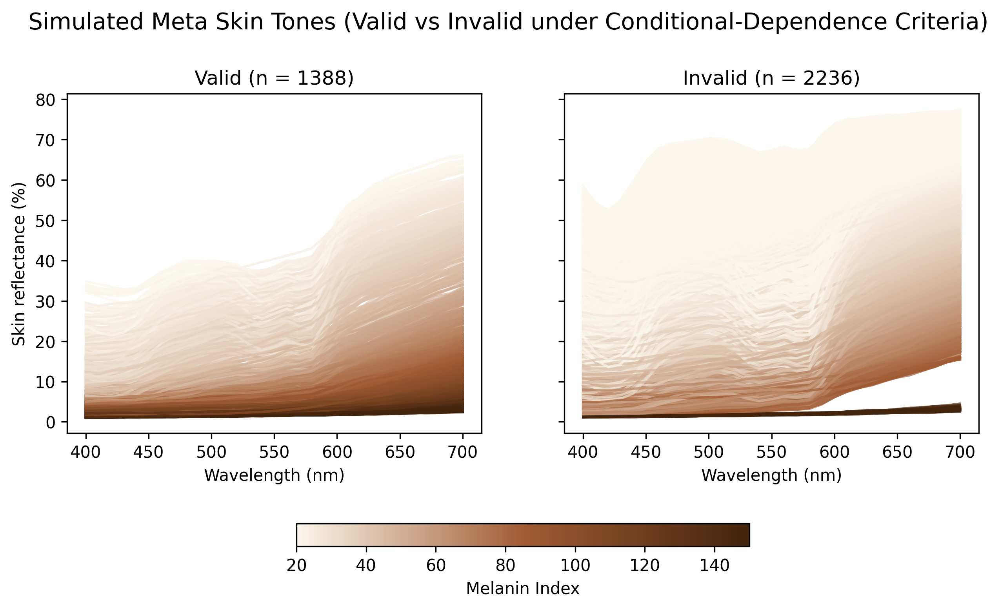

In [16]:
# Split the meta spectra and melanin index into valid and invalid sets
meta_spectra_conditional_valid = meta_spectra[valid_conditional_indices, :]
meta_mi_conditional_valid = meta_mi[valid_conditional_indices]
meta_spectra_conditional_invalid = meta_spectra[~valid_conditional_indices, :]
meta_mi_conditional_invalid = meta_mi[~valid_conditional_indices]

plot_spectra_filtered(meta_spectra_conditional_valid, meta_mi_conditional_valid, meta_spectra_conditional_invalid, meta_mi_conditional_invalid, issa_wavelengths, title="Simulated Meta Skin Tones (Valid vs Invalid under Conditional-Dependence Criteria)")

### Combine two criteria

Now we combine both filtering criteria to identify simulated skin spectra that are realistic according to both rules:

1. **Pointwise criteria**: Reflectance values at each wavelength must lie within $[0.9\min, 1.1\max]$ of ISSA face measurements
2. **Conditional dependence criteria**: Reflectance values at anchor wavelength pairs must satisfy the conditional relationships learned from ISSA data (within 99.5% credible intervals)

A sample is classified as **valid** only if it passes **both** criteria. This combined approach ensures that:
- Individual wavelength values are plausible (pointwise)
- The relationships between wavelengths follow realistic patterns (conditional dependence)

Samples failing either criterion are classified as invalid and filtered out from the final dataset.

In [17]:
# Combine both criteria: samples must pass both pointwise AND conditional tests
valid_combined_indices = np.logical_and(valid_pointwise_indices, valid_conditional_indices)

# Split the meta spectra into valid and invalid sets based on combined criteria
meta_spectra_combined_valid = meta_spectra[valid_combined_indices, :]
meta_mi_combined_valid = meta_mi[valid_combined_indices]
meta_params_combined_valid = meta_params[valid_combined_indices, :]

meta_spectra_combined_invalid = meta_spectra[~valid_combined_indices, :]
meta_mi_combined_invalid = meta_mi[~valid_combined_indices]
meta_params_combined_invalid = meta_params[~valid_combined_indices, :]

# Print summary statistics
print(f"Classification Summary:")
print(f"{'=' * 60}")
print(f"Total samples: {meta_spectra.shape[0]}")
print(f"")
print(f"Pointwise criteria only:")
print(f"  Valid: {np.sum(valid_pointwise_indices)} ({100 * np.sum(valid_pointwise_indices) / meta_spectra.shape[0]:.2f}%)")
print(f"  Invalid: {np.sum(~valid_pointwise_indices)} ({100 * np.sum(~valid_pointwise_indices) / meta_spectra.shape[0]:.2f}%)")
print(f"")
print(f"Conditional dependence criteria only:")
print(f"  Valid: {np.sum(valid_conditional_indices)} ({100 * np.sum(valid_conditional_indices) / meta_spectra.shape[0]:.2f}%)")
print(f"  Invalid: {np.sum(~valid_conditional_indices)} ({100 * np.sum(~valid_conditional_indices) / meta_spectra.shape[0]:.2f}%)")
print(f"")
print(f"Combined criteria (both must pass):")
print(f"  Valid: {np.sum(valid_combined_indices)} ({100 * np.sum(valid_combined_indices) / meta_spectra.shape[0]:.2f}%)")
print(f"  Invalid: {np.sum(~valid_combined_indices)} ({100 * np.sum(~valid_combined_indices) / meta_spectra.shape[0]:.2f}%)")

# Save combined results to CSV
output_dir = os.path.join(os.path.dirname(os.getcwd()), 'output')
combined_results_df = pd.DataFrame({
    'Sample': [f'Sample_{i}' for i in range(meta_spectra.shape[0])],
    'Pointwise_Valid': valid_pointwise_indices,
    'Conditional_Valid': valid_conditional_indices,
    'Combined_Valid': valid_combined_indices
})

output_file = os.path.join(output_dir, 'combined_validity.csv')
combined_results_df.to_csv(output_file, index=False)
# print(f"\nSaved combined validity results to {output_file}")

Classification Summary:
Total samples: 3624

Pointwise criteria only:
  Valid: 2220 (61.26%)
  Invalid: 1404 (38.74%)

Conditional dependence criteria only:
  Valid: 1388 (38.30%)
  Invalid: 2236 (61.70%)

Combined criteria (both must pass):
  Valid: 804 (22.19%)
  Invalid: 2820 (77.81%)


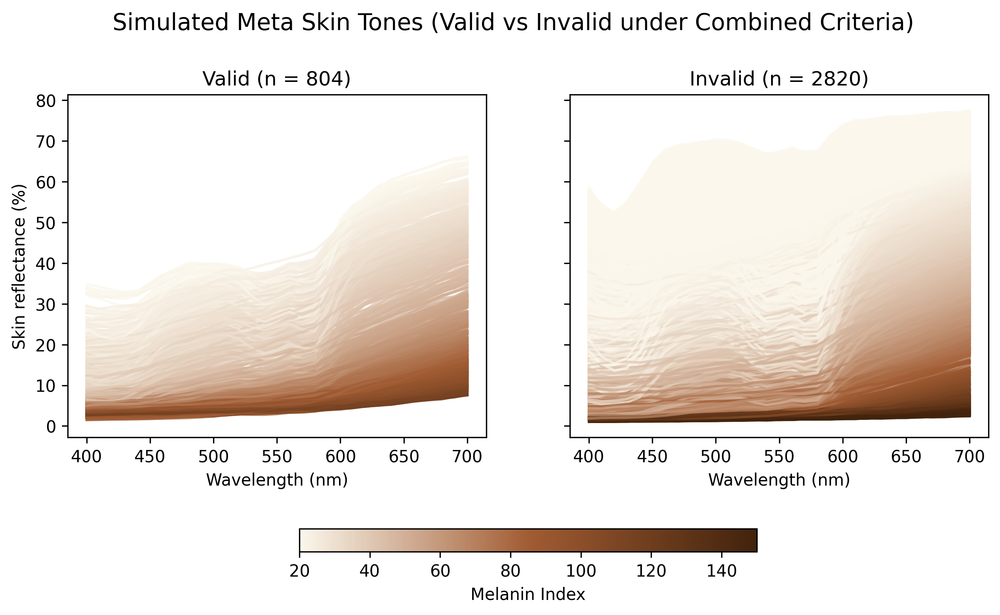

In [18]:
plot_spectra_filtered(meta_spectra_combined_valid, meta_mi_combined_valid, meta_spectra_combined_invalid, meta_mi_combined_invalid, issa_wavelengths, title="Simulated Meta Skin Tones (Valid vs Invalid under Combined Criteria)")

Parameter Ranges for Invalid Samples under Combined Criteria:

In [19]:
# Display the range of each parameter in meta_params_combined_invalid
param_names = ['Melanin Volume Fraction', 'Blood Volume Fraction', 'Thickness', 'Eumelanin Ratio', 'Oxygenated Hemoglobin Ratio']
param_ranges = {
    'Parameter': param_names,
    'Min': [round(meta_params_combined_invalid[:, i].min().item(), 3) for i in range(meta_params_combined_invalid.shape[1])],
    'Max': [round(meta_params_combined_invalid[:, i].max().item(), 3) for i in range(meta_params_combined_invalid.shape[1])],
    'Mean': [round(meta_params_combined_invalid[:, i].mean().item(), 3) for i in range(meta_params_combined_invalid.shape[1])],
    'Std': [round(meta_params_combined_invalid[:, i].std().item(), 3) for i in range(meta_params_combined_invalid.shape[1])]
}

param_df = pd.DataFrame(param_ranges)
# print("\nParameter Ranges for Invalid Samples under Combined Criteria:")
param_df

,Parameter,Min,Max,Mean,Std
0,Melanin Volume Fraction,0.001,0.429,0.111,0.134
1,Blood Volume Fraction,0.001,0.200,0.043,0.055
2,Thickness,0.001,0.035,0.017,0.010
3,Eumelanin Ratio,0.650,0.800,0.725,0.043
4,Oxygenated Hemoglobin Ratio,0.900,1.000,0.950,0.029


## Examine biological parameters of filtered simulated spectra

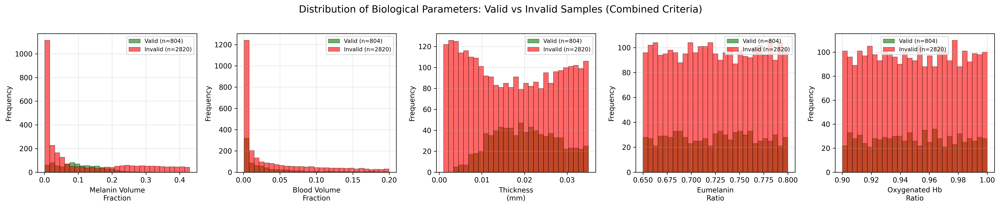

In [20]:
# Create side-by-side comparison of biological parameters for valid vs invalid samples
param_names = ['Melanin Volume\nFraction', 'Blood Volume\nFraction', 'Thickness\n(mm)', 'Eumelanin\nRatio', 'Oxygenated Hb\nRatio']

fig, axes = plt.subplots(1, 5, figsize=(20, 4), dpi=300)

for i, (ax, param_name) in enumerate(zip(axes, param_names)):
    # Get parameter data for valid and invalid samples
    valid_data = meta_params_combined_valid[:, i].numpy()
    invalid_data = meta_params_combined_invalid[:, i].numpy()
    
    # Create histograms
    bins = np.linspace(min(valid_data.min(), invalid_data.min()), 
                       max(valid_data.max(), invalid_data.max()), 30)
    
    ax.hist(valid_data, bins=bins, alpha=0.6, label=f'Valid (n={len(valid_data)})', 
            color='green', edgecolor='black', linewidth=0.5)
    ax.hist(invalid_data, bins=bins, alpha=0.6, label=f'Invalid (n={len(invalid_data)})', 
            color='red', edgecolor='black', linewidth=0.5)
    
    ax.set_xlabel(param_name, fontsize=10)
    ax.set_ylabel('Frequency', fontsize=10)
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3)

fig.suptitle('Distribution of Biological Parameters: Valid vs Invalid Samples (Combined Criteria)', 
             fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

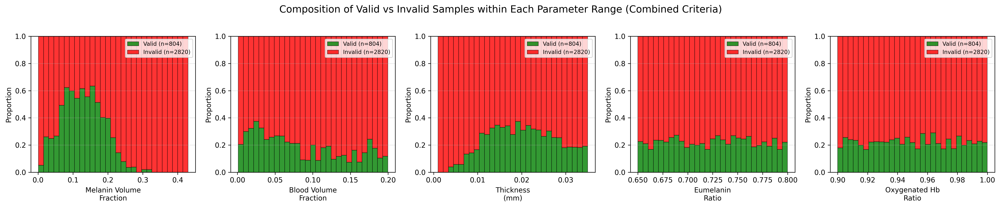

In [21]:
# Create side-by-side comparison showing proportion of valid/invalid within each bin
param_names = ['Melanin Volume\nFraction', 'Blood Volume\nFraction', 'Thickness\n(mm)', 'Eumelanin\nRatio', 'Oxygenated Hb\nRatio']

fig, axes = plt.subplots(1, 5, figsize=(20, 4), dpi=300)

for i, (ax, param_name) in enumerate(zip(axes, param_names)):
    # Get parameter data for valid and invalid samples
    valid_data = meta_params_combined_valid[:, i].numpy()
    invalid_data = meta_params_combined_invalid[:, i].numpy()
    
    # Create bins
    bins = np.linspace(min(valid_data.min(), invalid_data.min()), 
                       max(valid_data.max(), invalid_data.max()), 30)
    
    # Count samples in each bin
    valid_counts, _ = np.histogram(valid_data, bins=bins)
    invalid_counts, _ = np.histogram(invalid_data, bins=bins)
    
    # Calculate total count in each bin
    total_counts = valid_counts + invalid_counts
    
    # Calculate proportions (avoid division by zero)
    valid_props = np.divide(valid_counts, total_counts, 
                           out=np.zeros_like(valid_counts, dtype=float), 
                           where=total_counts != 0)
    invalid_props = np.divide(invalid_counts, total_counts, 
                             out=np.zeros_like(invalid_counts, dtype=float), 
                             where=total_counts != 0)
    
    # Get bin centers for plotting
    bin_centers = (bins[:-1] + bins[1:]) / 2
    bin_width = bins[1] - bins[0]
    
    # Create stacked bar chart
    ax.bar(bin_centers, valid_props, width=bin_width, alpha=0.8, 
           label=f'Valid (n={len(valid_data)})', color='green', edgecolor='black', linewidth=0.5)
    ax.bar(bin_centers, invalid_props, width=bin_width, alpha=0.8, bottom=valid_props,
           label=f'Invalid (n={len(invalid_data)})', color='red', edgecolor='black', linewidth=0.5)
    
    ax.set_xlabel(param_name, fontsize=10)
    ax.set_ylabel('Proportion', fontsize=10)
    ax.set_ylim([0, 1])
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3, axis='y')

fig.suptitle('Composition of Valid vs Invalid Samples within Each Parameter Range (Combined Criteria)', 
             fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

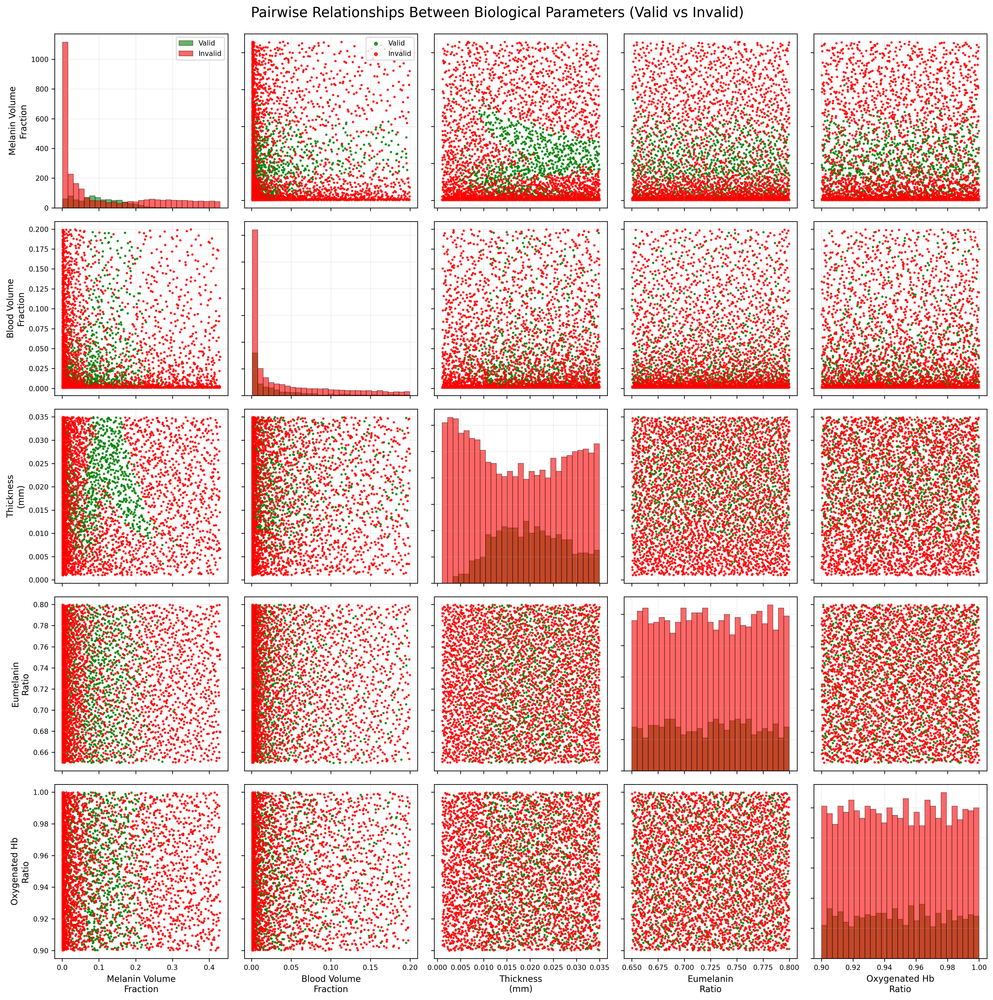

In [22]:
# Create scatter plot matrix showing relationships between parameters
param_names = ['Melanin Volume\nFraction', 'Blood Volume\nFraction', 'Thickness\n(mm)', 'Eumelanin\nRatio', 'Oxygenated Hb\nRatio']
n_params = len(param_names)

fig, axes = plt.subplots(n_params, n_params, figsize=(16, 16), dpi=300)

# Get parameter data
valid_params = meta_params_combined_valid.numpy()
invalid_params = meta_params_combined_invalid.numpy()

for i in range(n_params):
    for j in range(n_params):
        ax = axes[i, j]
        
        if i == j:
            # Diagonal: show histograms
            bins = np.linspace(
                min(valid_params[:, i].min(), invalid_params[:, i].min()),
                max(valid_params[:, i].max(), invalid_params[:, i].max()),
                30
            )
            ax.hist(valid_params[:, i], bins=bins, alpha=0.6, color='green', 
                   edgecolor='black', linewidth=0.5, label='Valid')
            ax.hist(invalid_params[:, i], bins=bins, alpha=0.6, color='red', 
                   edgecolor='black', linewidth=0.5, label='Invalid')
            if i == 0:
                ax.legend(fontsize=8)
        else:
            # Off-diagonal: show scatter plots
            ax.scatter(valid_params[:, j], valid_params[:, i], 
                      s=3, alpha=0.8, color='green', label='Valid' if i == 0 and j == 1 else '')
            ax.scatter(invalid_params[:, j], invalid_params[:, i], 
                      s=3, alpha=0.8, color='red', label='Invalid' if i == 0 and j == 1 else '')
            if i == 0 and j == 1:
                ax.legend(fontsize=8, markerscale=2)
        
        # Set labels
        if i == n_params - 1:
            ax.set_xlabel(param_names[j], fontsize=10)
        else:
            ax.set_xticklabels([])
            
        if j == 0:
            ax.set_ylabel(param_names[i], fontsize=10)
        else:
            ax.set_yticklabels([])
        
        ax.tick_params(labelsize=8)
        ax.grid(True, alpha=0.2)

fig.suptitle('Pairwise Relationships Between Biological Parameters (Valid vs Invalid)', 
             fontsize=16, y=0.995)
plt.tight_layout()
plt.show()

## PCA of skin reflectance spectra
We perform PCA on the combined ISSA skin reflectance spectra and the simulated skin reflectance spectra to visualize their distributions in the principal component space. We also show the loading vectors to understand which wavelengths contribute most to the variance captured by each principal component.

In [23]:
from sklearn.decomposition import PCA

# PCA on combined issa and meta spectra
combined_spectra = np.vstack((meta_spectra, face_spectra))
pca = PCA(n_components=2)
pca.fit(combined_spectra)
combined_spectra_pca = pca.transform(combined_spectra)

# Prepare validity group labels
validity_group = []
for i in range(meta_spectra.shape[0]):
    if valid_combined_indices[i]:
        validity_group.append('Valid (Both Pass)')
    elif valid_pointwise_indices[i]:
        validity_group.append('Invalid (Pointwise Pass, Conditional-Dependence Fail)')
    elif valid_conditional_indices[i]:
        validity_group.append('Invalid (Pointwise Fail, Conditional-Dependence Pass)')
    else:
        validity_group.append('Invalid (Both Fail)')
for i in range(face_spectra.shape[0]):
    validity_group.append('ISSA Face Sites')
validity_group = np.array(validity_group)

# Create a DataFrame for meta PCA results
combined_spectra_pca_df = pd.DataFrame({
    'PC1': combined_spectra_pca[:, 0],
    'PC2': combined_spectra_pca[:, 1],
    'Group': validity_group
})

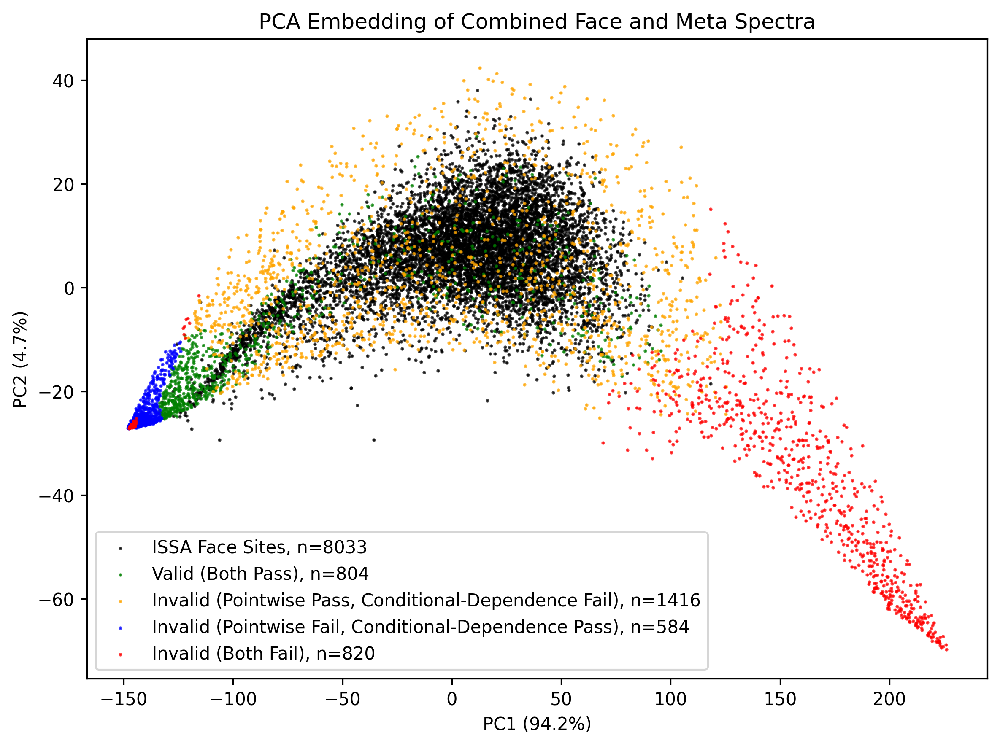

In [25]:
# Plot PCA embedding
fig, ax = plt.subplots(figsize=(8, 6), dpi=300)
for group, color in zip(
    ['ISSA Face Sites', 'Valid (Both Pass)', 'Invalid (Pointwise Pass, Conditional-Dependence Fail)', 'Invalid (Pointwise Fail, Conditional-Dependence Pass)', 'Invalid (Both Fail)'],
    ['black', 'green', 'orange', 'blue', 'red']
):
    subset = combined_spectra_pca_df[combined_spectra_pca_df['Group'] == group]
    ax.scatter(subset['PC1'], subset['PC2'], s=1, alpha=0.7, label=f'{group}, n={len(subset)}', color=color)
ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)")
ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)")
ax.set_title("PCA Embedding of Combined Face and Meta Spectra")
ax.legend()
plt.tight_layout()
plt.show()

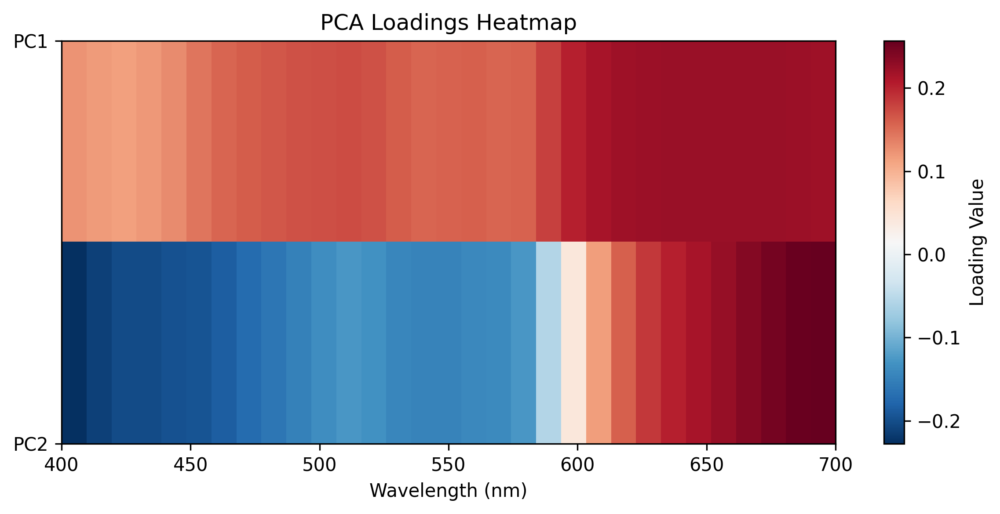

In [27]:
# PCA Loading Heatmap
fig, ax = plt.subplots(figsize=(8, 4), dpi=300)
cax = ax.imshow(pca.components_, aspect='auto', cmap='RdBu_r',
                extent=[issa_wavelengths[0], issa_wavelengths[-1], 1, 0])
ax.set_yticks([0, 1])
ax.set_yticklabels(['PC1', 'PC2'])
ax.set_xlabel('Wavelength (nm)')
ax.set_title('PCA Loadings Heatmap')
fig.colorbar(cax, ax=ax, label='Loading Value')
plt.tight_layout()
plt.show()